In [132]:
%reset
import sys
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import cv2

from pytorch3d.io import load_objs_as_meshes, save_obj
from pytorch3d.structures import Meshes
from pytorch3d.renderer import (
    look_at_view_transform,
    FoVPerspectiveCameras,
    PerspectiveCameras,
    PointLights,
    RasterizationSettings,
    MeshRasterizer,
    MeshRenderer,
    SoftPhongShader,
    SoftSilhouetteShader,
    TexturesVertex
)
from pytorch3d.renderer.blending import (
    BlendParams,
    sigmoid_alpha_blend
)

from pytorch3d.vis.plotly_vis import AxisArgs, plot_batch_individually, plot_scene
from pytorch3d.transforms import euler_angles_to_matrix
from pytorch3d.transforms.transform3d import Transform3d, Rotate, Translate, Scale
from pytorch3d.structures import join_meshes_as_batch, join_meshes_as_scene

In [133]:
# setup cuda/cpu device
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device=device)
    # clear cache
    torch.cuda.empty_cache()
else:
    device = torch.device("cpu")

# setup data
DATA_DIR = "../data/model/"
obj_file = os.path.join(DATA_DIR, "packet/mesh.obj")
bin_file = os.path.join(DATA_DIR, "crate/14029_Plastic_Fruit_Crate_v1_L1.obj")

# load mesh obj
obj_mesh = load_objs_as_meshes([obj_file], device=device)
bin_mesh = load_objs_as_meshes([bin_file], device=device)

# We scale normalize and center the target mesh to fit in a sphere of radius 1 
# centered at (0,0,0). (scale, center) will be used to bring the predicted mesh 
# to its original center and scale.  Note that normalizing the target mesh, 
# speeds up the optimization but is not necessary!
verts = obj_mesh.verts_packed()
N = verts.shape[0]
center = verts.mean(0)
scale = max((verts - center).abs().max(0)[0])
obj_mesh.offset_verts_(-center)
obj_mesh.scale_verts_((1.0 / float(scale)))

verts = bin_mesh.verts_packed()
N = verts.shape[0]
center = verts.mean(0)
scale = max((verts - center).abs().max(0)[0])
bin_mesh.offset_verts_(-center)
bin_mesh.scale_verts_((1.0 / float(scale)))

num cams =  1


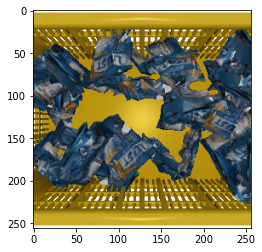

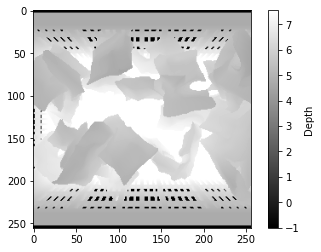

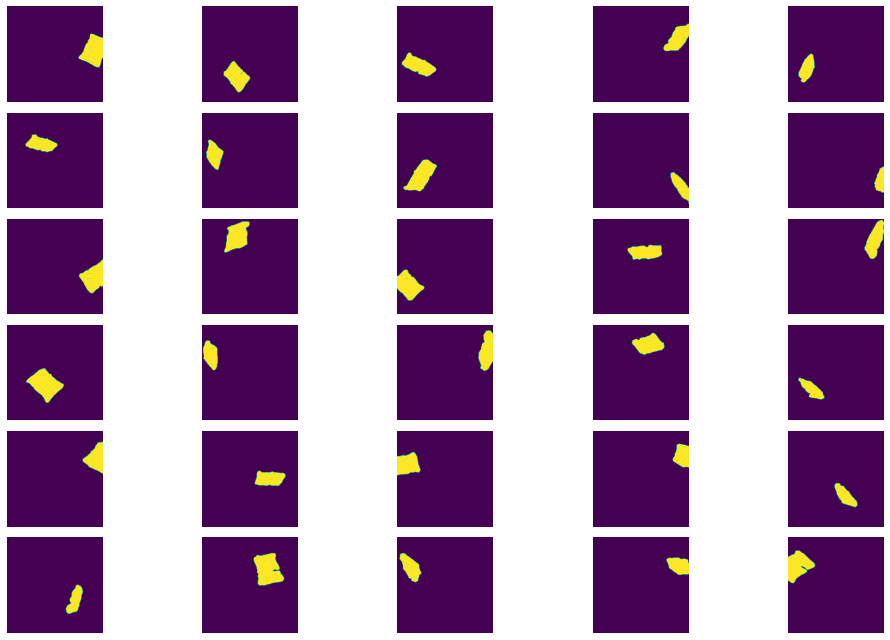

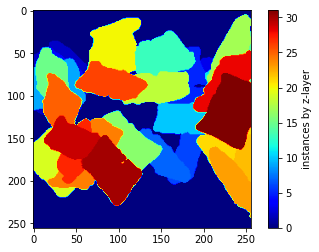

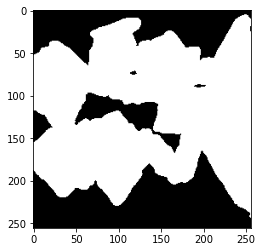

In [134]:
num_objects = 30

# scale and transform bin mesh as per object sizes
scale = Scale(4, device=device)
rotate = Rotate(euler_angles_to_matrix(torch.deg2rad(torch.tensor([180,0,0])), "XYZ"), device=device)
#translate = Translate(x.mean(), y.mean(), z.mean(), device=device)
translate = Translate(0, 0, 6, device=device)
transform = Transform3d(device=device).compose(scale).compose(rotate).compose(translate)
bin_mesh_tranformed = bin_mesh.clone()
bin_mesh_tranformed = bin_mesh_tranformed.update_padded(transform.transform_points(bin_mesh_tranformed.verts_padded()))

bin_verts = bin_mesh_tranformed.verts_list()[0]
min_xyz, _ = torch.min(bin_verts, dim=0)
max_xyz, _ = torch.max(bin_verts, dim=0)

(minx, miny, minz) = min_xyz.cpu().numpy()
(maxx, maxy, maxz) = max_xyz.cpu().numpy()

# centers = torch.rand(num_objects, 3) * 2 # random centers for each object. Multiply by a scalar to space object farther
# x = torch.linspace(-2,2,10)
# y = torch.linspace(-2,2,10)
# z = torch.linspace(-1,1, num_objects)
# y = torch.rand(num_objects) * 3
# x = torch.rand(num_objects) * 5
#z = torch.rand(num_objects)

border_padding = 0.5
x = torch.tensor(np.random.uniform(minx + border_padding, maxx - border_padding, num_objects))
y = torch.tensor(np.random.uniform(miny + border_padding, maxy - border_padding, num_objects))
z = torch.tensor(np.random.uniform(minz + border_padding, maxz - border_padding, num_objects))
centers = torch.stack([x,y,z], dim=1)
angles = torch.deg2rad(torch.randint(0, 360, (num_objects, 3))) # random rotation angles for each object.
R = euler_angles_to_matrix(angles, "XYZ") # rotation matrix from axis/euler angles.
rotate = Rotate(R, device=device) # rotation transformation
translate = Translate(centers, device=device) # tranlation transformation
transform = Transform3d(device=device).compose(rotate).compose(translate) # combined transformation for each object

meshes = obj_mesh.extend(num_objects) # create num_object meshes
meshes = meshes.update_padded(transform.transform_points(meshes.verts_padded())) # transform each object mesh


# setup camera
image_size = 256
R = torch.eye(3).unsqueeze(0)
#T = torch.tensor([[-x.mean(), -y.mean(), 6]])
T = torch.tensor([[0, 0, 0]])
cameras = FoVPerspectiveCameras(
    R = R,
    T = T,
    device = device
)
print("num cams = ", len(cameras))
cameras.get_camera_center()
transform = cameras.get_world_to_view_transform()
transform.get_matrix()
lights = PointLights(device=device, location=[[0.0, 0.0, -6.0]])

# show scene rendering for debugging
scene = plot_scene({
    "figure": {
        "Mesh": join_meshes_as_scene([meshes, bin_mesh_tranformed]),
        "Camera": cameras
    }
})
scene.show()

# custome Renderer to get depth
class MeshRendererWithDepth(torch.nn.Module):
    def __init__(self, rasterizer, shader):
        super().__init__()
        self.rasterizer = rasterizer
        self.shader = shader

    def forward(self, meshes_world, **kwargs) -> torch.Tensor:
        fragments = self.rasterizer(meshes_world, **kwargs)
        images = self.shader(fragments, meshes_world, **kwargs)
        return images, fragments.zbuf

raster_settings = RasterizationSettings(
    image_size=image_size, blur_radius=0.0, faces_per_pixel=1,
)
renderer = MeshRendererWithDepth(
    rasterizer=MeshRasterizer(raster_settings=raster_settings),
    shader = SoftPhongShader(device=device, lights=lights, cameras=cameras)
)

rendered_images, depth = renderer(join_meshes_as_scene([meshes, bin_mesh_tranformed]), cameras=cameras)
image = rendered_images[0].cpu().numpy()
depth_img = depth.cpu().numpy()
plt.imsave("rgb_image.png", image)
plt.imsave("depth_image.png", depth_img)
plt.figure()
plt.imshow(image[...,:3])
plt.figure()
plt.imshow(depth_img[0,:,:,0], cmap='gray')
plt.colorbar(label="Depth")
plt.show()

x = np.linspace(0, image_size-1, image_size)
y = np.linspace(0, image_size-1, image_size)
x, y = np.meshgrid(x,y)
x = x.flatten()
y = y.flatten()
z = depth_img.squeeze().flatten()
depth_points = np.hstack([x,y,z]).T


del rendered_images, depth, image, depth_img, raster_settings, renderer, scene, bin_mesh, obj_mesh
torch.cuda.empty_cache()

# Custome Shader class to obtain object mask
class MaskShader(torch.nn.Module):
    def __init__(self, device="cpu"):
        super().__init__()
    def forward(self, fragments, meshes, **kwargs) -> torch.Tensor:
        N, H, W, K = fragments.pix_to_face.shape
        device = fragments.pix_to_face.device

        # background mask
        is_background = fragments.pix_to_face[..., 0] < 0
        is_background = is_background.unsqueeze(3)
        bg = torch.zeros((N,H,W,1)).to(device)
        fg = torch.stack([torch.ones(H,W,1) * i for i in range(N+1, 1, -1)]).to(device)
        images = bg + (~is_background * fg)
        return images # (N, H, W, 1) RGBA image

sigma = 1e-4
raster_settings = RasterizationSettings(
    image_size=image_size,
    blur_radius=np.log(1. / 1e-4 - 1.)*sigma, 
    faces_per_pixel=50, 
)

renderer = MeshRenderer(
    rasterizer=MeshRasterizer(raster_settings=raster_settings),
    shader = MaskShader()
)

rendered_images = renderer(meshes, cameras=cameras) # generate masks for only obj meshes without bin
fig, axs = plt.subplots(6, 5, figsize=(15,9))
bleed = 0
fig.subplots_adjust(left=bleed, bottom=bleed, right=(1-bleed), top=(1-bleed))
for ax, im in zip(axs.ravel(), rendered_images.cpu().numpy()):
    ax.imshow(im[...,0])
    ax.set_axis_off()
plt.tight_layout()
plt.show()

masks = rendered_images.cpu().numpy()
single_mask = masks.max(axis=0)
cv2.imwrite("modal_segmask.png", single_mask)
plt.figure()
plt.imshow(single_mask, cmap='jet')
plt.colorbar(label='instances by z-layer')

fg = masks.sum(axis=0) > 0
filled_mask = np.ones_like(single_mask) * fg
cv2.imwrite("segmask_filled.png", filled_mask)
plt.figure()
plt.imshow(filled_mask, cmap='gray')



In [ ]:
R = torch.eye(3).unsqueeze(0)
T = torch.tensor([[-x.mean(), -y.mean(), 6]])
cameras = FoVPerspectiveCameras(
    R = R,
    T = T,
    #in_ndc=False,
    #image_size=(image_size, image_size),
    device = device
)
c = cameras.get_camera_center()
print(c)
transform = cameras.get_world_to_view_transform()
transform.get_matrix()

In [137]:
projection_transform = cameras.get_full_projection_transform()
print(projection_transform.get_matrix())

tensor([[[ 1.7324,  0.0000,  0.0000,  0.0000],
         [ 0.0000,  1.7324,  0.0000,  0.0000],
         [ 0.0000,  0.0000,  1.0098,  1.0000],
         [ 0.0000,  0.0000, -1.0098,  0.0000]]], device='cuda:0')


In [136]:
from pytorch3d.renderer.cameras import get_ndc_to_screen_transform

transform = get_ndc_to_screen_transform(cameras, with_xyflip=True, image_size=(image_size, image_size))
print(transform.get_matrix().transpose(1,2).contiguous())

tensor([[[-128.,    0.,    0.,  128.],
         [   0., -128.,    0.,  128.],
         [   0.,    0.,    1.,    0.],
         [   0.,    0.,    0.,    1.]]], device='cuda:0')


In [138]:
print(image_size)

256


In [139]:
points = torch.tensor(np.stack([x,y,z]).T, dtype=torch.float32)
print(points.shape)

torch.Size([65536, 3])


In [140]:
pts = projection_transform.inverse().transform_points(points.to(device))

In [141]:
pts.shape
d = pts[:,2].reshape(256,256)
d.shape

torch.Size([256, 256])

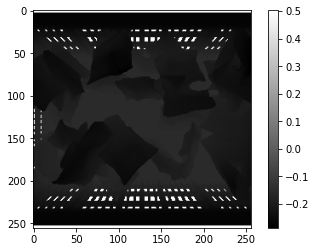

In [142]:
plt.imshow(d.cpu().numpy(), cmap='gray')
plt.colorbar()
plt.show()

In [ ]:
verts = bin_mesh_tranformed.verts_list()[0]
print(verts.shape)

(max_x, max_y, max_z), _ = torch.max(verts, dim=0)
min, _ = torch.min(verts, dim=0)

print(max_x)
print(min)


In [ ]:
verts[0,:]